In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install cuml-cu12

In [3]:
import joblib
import glob
import os
import json
import kagglehub
import pandas as pd
import matplotlib.pyplot as plt
import keras
import tensorflow as tf
import cuml.ensemble
import seaborn as sns

In [4]:
!pip install kagglehub

In [5]:
path = kagglehub.dataset_download("florianhinrichsen/nyc-taxi-data-2023-24-normalized/version/3")

DO_datasets = {f"{path}/hourlyDOs202324_Normalized.parquet": "DOs",
            f"{path}/hourlyDOs202324WEATHER_Normalized.parquet":"DOsWEATHER",
            f"{path}/hourlyDOs202324CYCLt_Normalized.parquet": "DOsCYCLt",
            f"{path}/hourlyDOs202324WEATHER_CYCLt_Normalized.parquet":"DOsWEATHER_CYCLt"}

PU_datasets ={f"{path}/hourlyPUs202324_Normalized.parquet":"PUs",
            f"{path}/hourlyPUs202324WEATHER_Normalized.parquet":"PUsWEATHER",
            f"{path}/hourlyPUs202324CYCLt_Normalized.parquet":"PUsCYCLt",
            f"{path}/hourlyPUs202324WEATHER_CYCLt_Normalized.parquet":"PUsWEATHER_CYCLt"}

ridge_path = kagglehub.dataset_download("florianhinrichsen/ridgeregression")
ridge_files = glob.glob(ridge_path + "/*.pkl")
rf_path = kagglehub.dataset_download("florianhinrichsen/randomforest")
rf_files = glob.glob(rf_path + "/*.pkl")
nn_path = kagglehub.dataset_download("florianhinrichsen/neuralnetwork")
nn_files = glob.glob(nn_path + "/*.keras")

100%|██████████| 1.52G/1.52G [01:32<00:00, 17.7MB/s]

Extracting files...


100%|██████████| 58.9k/58.9k [00:00<00:00, 958kB/s]

Extracting files...


100%|██████████| 79.5M/79.5M [00:06<00:00, 13.2MB/s]

Extracting files...


100%|██████████| 1.85M/1.85M [00:01<00:00, 1.63MB/s]

Extracting files...


### Plotting Feedforward Neural Network Results

In [6]:
import pandas as pd
import tensorflow as tf

# Initialize the DataFrame to store Drop-Off actuals and predictions
DO_results = None

for file in DO_datasets:
    # Read the dataset file
    df = pd.read_parquet(file)

    # Rename the second column to 'date'
    df = df.rename(columns={df.columns[1]:"date"})

    # Filter for rows in the years 2023 and 2024
    df = df[df["year"].isin([2023, 2024])]

    # Map the year values to binary integers (2023 to 0, 2024 to 1)
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop specific columns, ignoring errors if they do not exist
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Remove any rows containing NaN values
    df = df.dropna()

    # Create the test set using data from January 1st, 2024 onwards
    df_test = df[df["date"]>=pd.to_datetime("2024-01-01")].copy()

    # Define the feature matrix by dropping the target variable and date
    X_test = df_test.drop(columns=["trip_count","date"])

    # Initialize the DO_results DataFrame during the first loop iteration
    if DO_results is None:
        DO_results = pd.DataFrame({
            "Date" : df_test["date"],
            "Actual" : df_test["trip_count"]
        }).set_index("Date")

    # Find the matching neural network (.keras) model file for the current dataset
    for model in nn_files:
        if f"{DO_datasets[file]}.keras" in model:
            right_model = model
            break

    # Clear the TensorFlow backend session to free memory and prevent model bleed
    tf.keras.backend.clear_session()

    # Load the Keras model (compile=False saves time since we are only doing inference)
    nn_model = tf.keras.models.load_model(right_model, compile=False)

    # Convert the pandas feature DataFrame into a TensorFlow float32 tensor
    X_test_tensor = tf.constant(X_test.values, dtype=tf.float32)

    # Generate predictions using the loaded neural network
    preds = nn_model.predict(X_test_tensor)

    # Flatten the 2D prediction array into 1D and store it in the results DataFrame
    DO_results[f"{DO_datasets[file]}"] = preds.flatten()


# Initialize the DataFrame to store Pick-Up actuals and predictions
PU_results = None

for file in PU_datasets:
    # Read the dataset file
    df = pd.read_parquet(file)

    # Rename the second column to 'date'
    df = df.rename(columns={df.columns[1]:"date"})

    # Filter for rows in the years 2023 and 2024
    df = df[df["year"].isin([2023, 2024])]

    # Map the year values to binary integers (2023 to 0, 2024 to 1)
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop specific columns, ignoring errors if they do not exist
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Remove any rows containing NaN values
    df = df.dropna()

    # Create the test set using data from January 1st, 2024 onwards
    df_test = df[df["date"]>=pd.to_datetime("2024-01-01")].copy()

    # Define the feature matrix by dropping the target variable and date
    X_test = df_test.drop(columns=["trip_count","date"])

    # Initialize the PU_results DataFrame during the first loop iteration
    if PU_results is None:
        PU_results = pd.DataFrame({
            "Date" : df_test["date"],
            "Actual" : df_test["trip_count"]
        }).set_index("Date")

    # Find the matching neural network (.keras) model file for the current dataset
    for model in nn_files:
        if f"{PU_datasets[file]}.keras" in model:
            right_model = model
            break

    # Clear the TensorFlow backend session to free memory and prevent model bleed
    tf.keras.backend.clear_session()

    # Load the Keras model (compile=False saves time since we are only doing inference)
    nn_model = tf.keras.models.load_model(right_model, compile=False)

    # Convert the pandas feature DataFrame into a TensorFlow float32 tensor
    X_test_tensor = tf.constant(X_test.values, dtype=tf.float32)

    # Generate predictions using the loaded neural network
    preds = nn_model.predict(X_test_tensor)

    # Flatten the 2D prediction array into 1D and store it in the results DataFrame
    PU_results[f"{PU_datasets[file]}"] = preds.flatten()



69629/69629 ━━━━━━━━━━━━━━━━━━━━ 89s 1ms/step
69629/69629 ━━━━━━━━━━━━━━━━━━━━ 93s 1ms/step
69629/69629 ━━━━━━━━━━━━━━━━━━━━ 90s 1ms/step
69629/69629 ━━━━━━━━━━━━━━━━━━━━ 90s 1ms/step
69061/69061 ━━━━━━━━━━━━━━━━━━━━ 89s 1ms/step
69061/69061 ━━━━━━━━━━━━━━━━━━━━ 93s 1ms/step
69061/69061 ━━━━━━━━━━━━━━━━━━━━ 92s 1ms/step
69061/69061 ━━━━━━━━━━━━━━━━━━━━ 93s 1ms/step


In [7]:
# Reverse the scaling transformation for the Pick-Up results (multiply by 126, add 71)
PU_unscaled = (PU_results * 126) + 71

# Reverse the scaling transformation for the Drop-Off results (multiply by 125, add 68)
DO_unscaled = (DO_results * 125) + 68

# Group the unscaled Pick-Up data by month (extracted from the datetime index) and calculate the sum
PUs_monthly = PU_unscaled.groupby(PU_unscaled.index.month).sum()

# Group the unscaled Drop-Off data by month (extracted from the datetime index) and calculate the sum
DOs_monthly = DO_unscaled.groupby(DO_unscaled.index.month).sum()

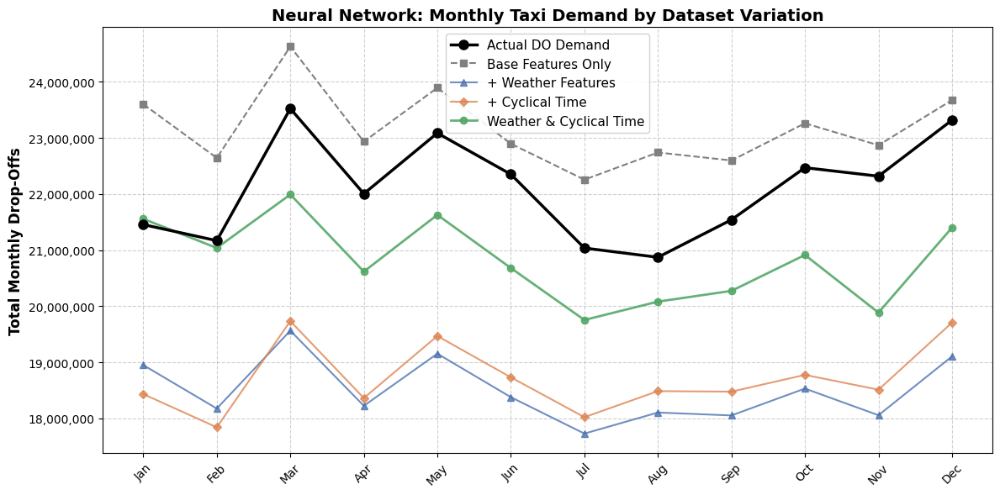

In [8]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, ax = plt.subplots(figsize=(12, 6))

# 1. Plot Actual (Thick black line with large circle markers)
ax.plot(DOs_monthly.index, DOs_monthly['Actual'], label='Actual DO Demand',
        color='black', linewidth=2.5, marker='o', markersize=8, zorder=5)

# 2. Plot Base Model (Dashed gray with square markers)
# Replace 'DOs' with the exact name of your base column
ax.plot(DOs_monthly.index, DOs_monthly['DOs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5, marker='s', markersize=6)

# 3. Plot Enhanced Datasets (Solid colors with triangle/diamond markers)
ax.plot(DOs_monthly.index, DOs_monthly['DOsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, marker='^', markersize=6, alpha=0.8)

ax.plot(DOs_monthly.index, DOs_monthly['DOsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, marker='D', markersize=5, alpha=0.8)

ax.plot(DOs_monthly.index, DOs_monthly['DOsWEATHER_CYCLt'], label='Weather & Cyclical Time',
        color='#55A868', linewidth=2, marker='o', markersize=6, alpha=0.9)

# Format X-axis to show only the Month and Year (e.g., Jan 2023)
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=range(1, 13), labels=month_names, rotation=45)
plt.xticks(rotation=45)

# Format Y-axis to add commas for large numbers (e.g., 1,500,000)
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Labels and Grid
ax.set_ylabel('Total Monthly Drop-Offs', fontsize=12, fontweight='bold')
ax.set_title('Neural Network: Monthly Taxi Demand by Dataset Variation', fontsize=14, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.9)
ax.grid(True, linestyle='--', alpha=0.6)

fig.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/NNMonthlyDOs.pdf", dpi=300)
plt.show()

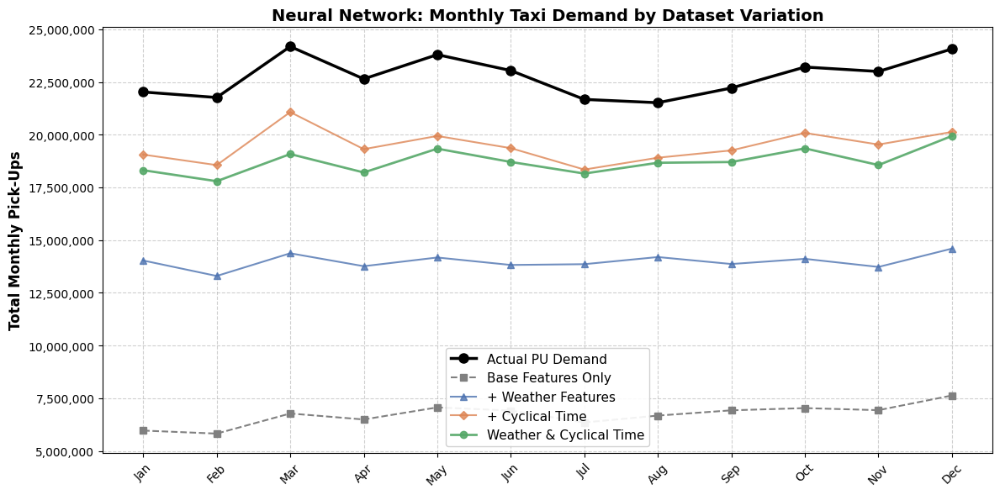

In [9]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, ax = plt.subplots(figsize=(12, 6))

# 1. Plot Actual (Thick black line with large circle markers)
ax.plot(PUs_monthly.index, PUs_monthly['Actual'], label='Actual PU Demand',
        color='black', linewidth=2.5, marker='o', markersize=8, zorder=5)

# 2. Plot Base Model (Dashed gray with square markers)
# Replace 'DOs' with the exact name of your base column
ax.plot(PUs_monthly.index, PUs_monthly['PUs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5, marker='s', markersize=6)

# 3. Plot Enhanced Datasets (Solid colors with triangle/diamond markers)
ax.plot(PUs_monthly.index, PUs_monthly['PUsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, marker='^', markersize=6, alpha=0.8)

ax.plot(PUs_monthly.index, PUs_monthly['PUsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, marker='D', markersize=5, alpha=0.8)

ax.plot(PUs_monthly.index, PUs_monthly['PUsWEATHER_CYCLt'], label='Weather & Cyclical Time',
        color='#55A868', linewidth=2, marker='o', markersize=6, alpha=0.9)

# Format X-axis to show only the Month and Year (e.g., Jan 2023)
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=range(1, 13), labels=month_names, rotation=45)
plt.xticks(rotation=45)

# Format Y-axis to add commas for large numbers (e.g., 1,500,000)
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Labels and Grid
ax.set_ylabel("Total Monthly Pick-Ups", fontsize=12, fontweight='bold')
ax.set_title("Neural Network: Monthly Taxi Demand by Dataset Variation", fontsize=14, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.9)
ax.grid(True, linestyle='--', alpha=0.6)

fig.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/NNMonthlyDOs.pdf", dpi=300)
plt.show()

In [10]:
# Group the unscaled Pick-Up data by the day of the year (1-365/366) extracted from the index and calculate the daily sum
PU_daily = PU_unscaled.groupby(PU_unscaled.index.dayofyear).sum()

# Group the unscaled Drop-Off data by the day of the year extracted from the index and calculate the daily sum
DO_daily = DO_unscaled.groupby(DO_unscaled.index.dayofyear).sum()

# Calculate a 7-day rolling average (moving average) for the daily Pick-Up totals
PU_rolling = PU_daily.rolling(window=7).mean()

# Calculate a 7-day rolling average (moving average) for the daily Drop-Off totals
DO_rolling = DO_daily.rolling(window=7).mean()

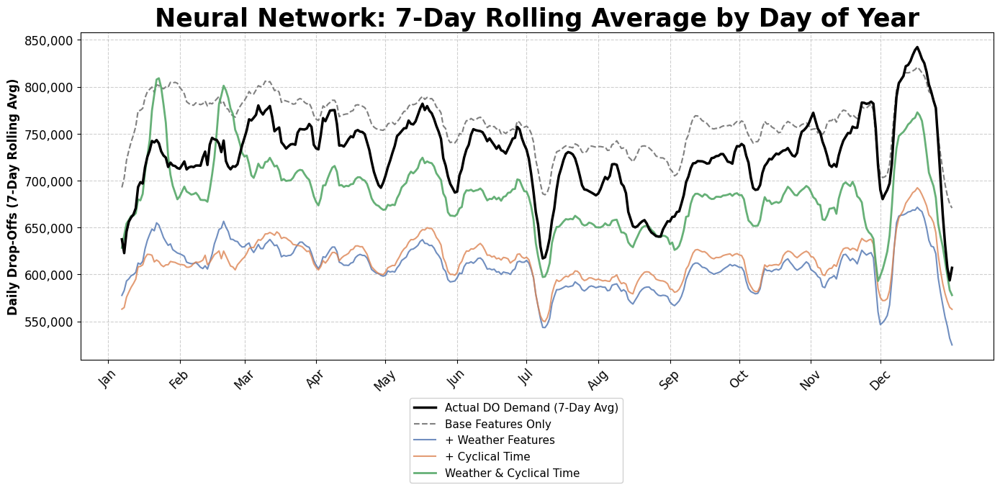

In [11]:
fig, ax = plt.subplots(figsize=(14, 7))

# Actual (Thick black line)
ax.plot(DO_rolling.index, DO_rolling['Actual'], label='Actual DO Demand (7-Day Avg)',
        color='black', linewidth=2.5, zorder=5)

# Base Model (Dashed gray)
ax.plot(DO_rolling.index, DO_rolling['DOs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5)

# Enhanced Datasets (Solid colors)
ax.plot(DO_rolling.index, DO_rolling['DOsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, alpha=0.8)

ax.plot(DO_rolling.index, DO_rolling['DOsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, alpha=0.8)

ax.plot(DO_rolling.index, DO_rolling['DOsWEATHER_CYCLt'], label='Weather & Cyclical Time',
        color='#55A868', linewidth=2, alpha=0.9)

# We manually map the approximate start day of each month for the x-axis
month_starts = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=month_starts, labels=month_labels, rotation=45, fontsize=12)

# Format Y-axis with commas
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ','))) # AI generated

ax.tick_params(axis='y', labelsize=12)

# Formatting
ax.set_ylabel('Daily Drop-Offs (7-Day Rolling Avg)', fontsize=12, fontweight='bold')
ax.set_title('Neural Network: 7-Day Rolling Average by Day of Year', fontsize=25, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.9, bbox_to_anchor=(0.6,-0.1))
ax.grid(True, linestyle='--', alpha=0.6)

fig.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/NN7DayDOs.pdf", dpi=300)
plt.show()

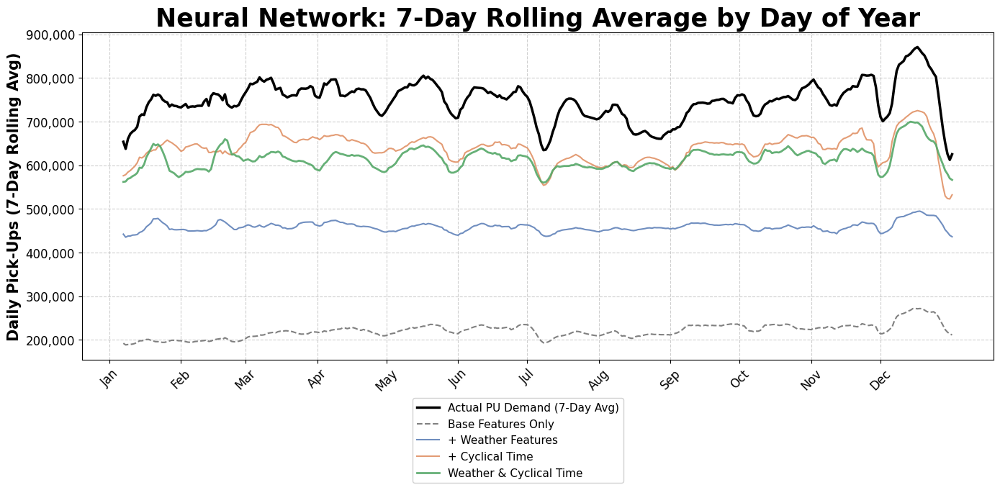

In [12]:
fig, ax = plt.subplots(figsize=(14, 7))

# Actual (Thick black line)
ax.plot(PU_rolling.index, PU_rolling['Actual'], label='Actual PU Demand (7-Day Avg)',
        color='black', linewidth=2.5, zorder=5)

# Base Model (Dashed gray)
ax.plot(PU_rolling.index, PU_rolling['PUs'], label='Base Features Only',
        color='gray', linestyle='--', linewidth=1.5)

# Enhanced Datasets (Solid colors)
ax.plot(PU_rolling.index, PU_rolling['PUsWEATHER'], label='+ Weather Features',
        color='#4C72B0', linewidth=1.5, alpha=0.8)

ax.plot(PU_rolling.index, PU_rolling['PUsCYCLt'], label='+ Cyclical Time',
        color='#DD8452', linewidth=1.5, alpha=0.8)

ax.plot(PU_rolling.index, PU_rolling['PUsWEATHER_CYCLt'], label='Weather & Cyclical Time',
        color='#55A868', linewidth=2, alpha=0.9)


# We manually map the approximate start day of each month for the x-axis
month_starts = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(ticks=month_starts, labels=month_labels, rotation=45, fontsize=12)

# Format Y-axis with commas
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ','))) # AI generated

ax.tick_params(axis='y', labelsize=12)

# Formatting
ax.set_ylabel('Daily Pick-Ups (7-Day Rolling Avg)', fontsize=15, fontweight='bold')
ax.set_title('Neural Network: 7-Day Rolling Average by Day of Year', fontsize=25, fontweight='bold')
ax.legend(loc='best', fontsize=11, framealpha=0.9, bbox_to_anchor=(0.6,-0.1))
ax.grid(True, linestyle='--', alpha=0.6)

fig.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/NN7DayPUs.pdf", dpi=300)
plt.show()

Scatter Plots

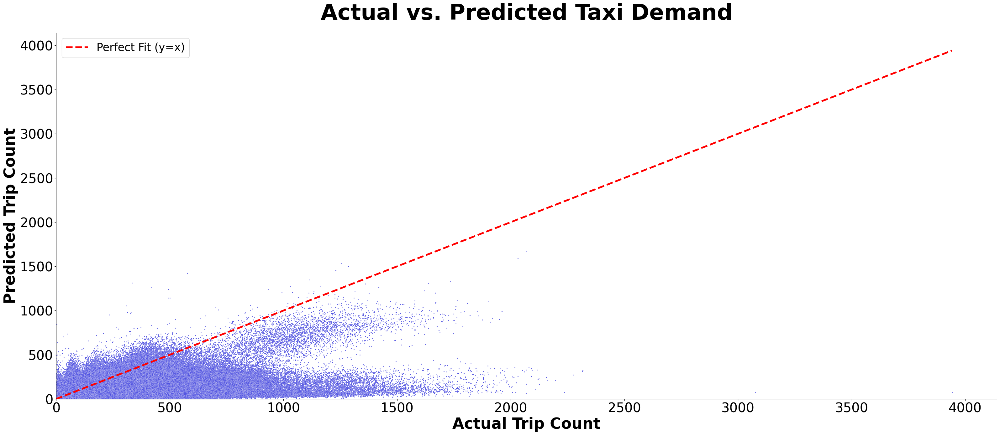

In [13]:
import seaborn as sns

actuals = PU_unscaled['Actual']
preds = PU_unscaled['PUs']


plt.figure(figsize=(32, 14))

sns.scatterplot(
    x=actuals,
    y=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the perfect fit diagonal line
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Taxi Demand", fontsize=50, fontweight="bold", pad=30)
plt.xlabel("Actual Trip Count", fontweight="bold", fontsize=35)
plt.ylabel("Predicted Trip Count", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


# Add a legend for the y=x line
plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("Scatter_Actual_vs_Predicted_Styled.png", dpi=300)
plt.show()

In [14]:
# Filter the unscaled Pick-Up DataFrame to remove rows containing extreme values.
# The .all(axis=1) condition ensures that a row is only kept if the actual value
# AND all model predictions in that row are strictly less than 2,500.
PU_filtered = PU_unscaled[(PU_unscaled < 2500).all(axis=1)]

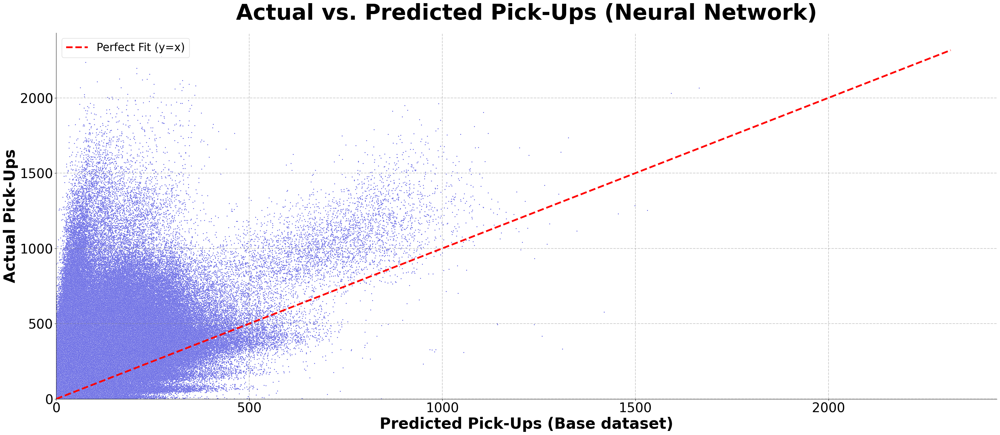

In [15]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUs"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the perfect fit diagonal line
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Pick-Ups (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Pick-Ups (Base dataset)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNScatterPUs.pdf", dpi=300)
plt.show()

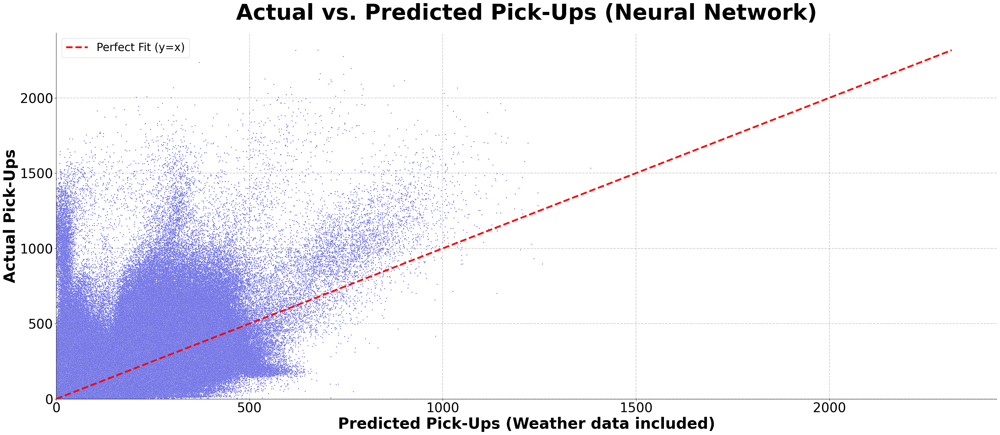

In [16]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the perfect fit diagonal line
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Pick-Ups (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Pick-Ups (Weather data included)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNScatterPUsWEATHER.pdf", dpi=300)
plt.show()

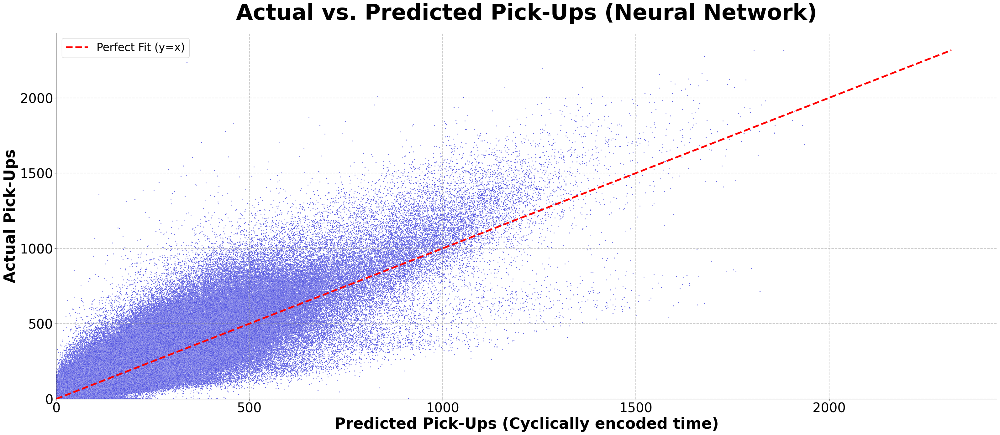

In [17]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsCYCLt"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the perfect fit diagonal line
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Pick-Ups (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Pick-Ups (Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNScatterPUsCYCLt.pdf", dpi=300)
plt.show()

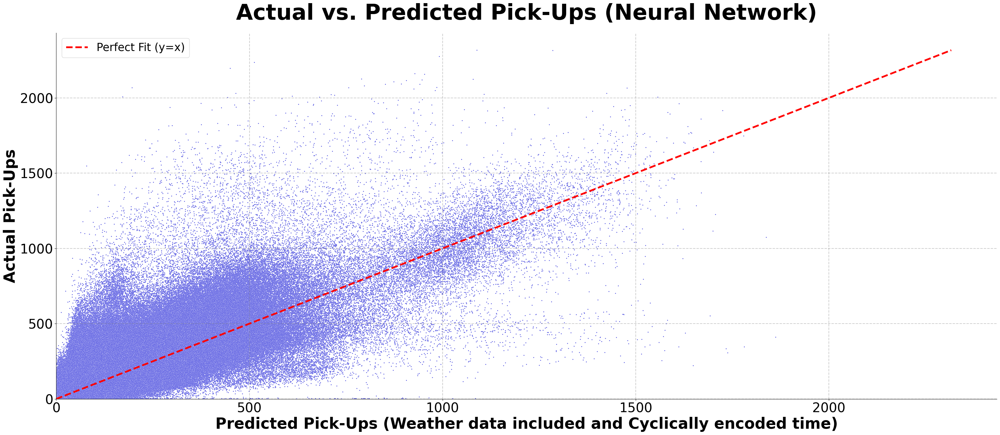

In [18]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER_CYCLt"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the perfect fit diagonal line
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Pick-Ups (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Pick-Ups (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNScatterPUsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

In [19]:
# Filter the unscaled Drop-Off DataFrame to remove rows containing extreme values.
# The .all(axis=1) condition ensures that a row is only kept if the actual value
# AND all model predictions in that row are strictly less than 2,500.
DO_filtered = DO_unscaled[(DO_unscaled < 2500).all(axis=1)]

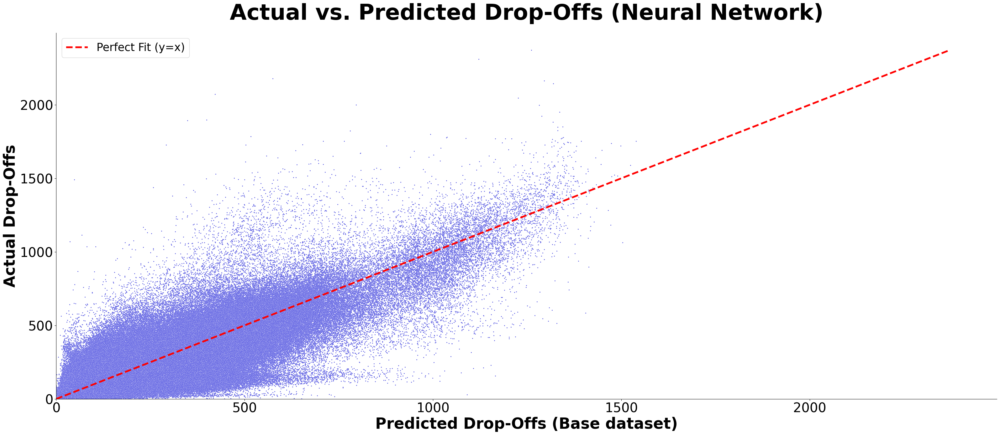

In [20]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOs"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the perfect fit diagonal line
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Drop-Offs (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Drop-Offs (Base dataset)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNScatterDOs.pdf", dpi=300)
plt.show()

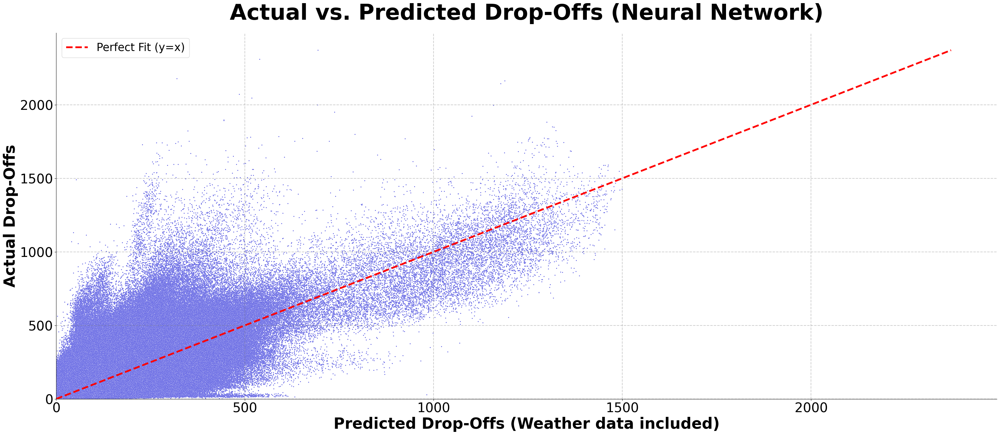

In [21]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the perfect fit diagonal line
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Drop-Offs (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Drop-Offs (Weather data included)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNScatterDOsWEATHER.pdf", dpi=300)
plt.show()

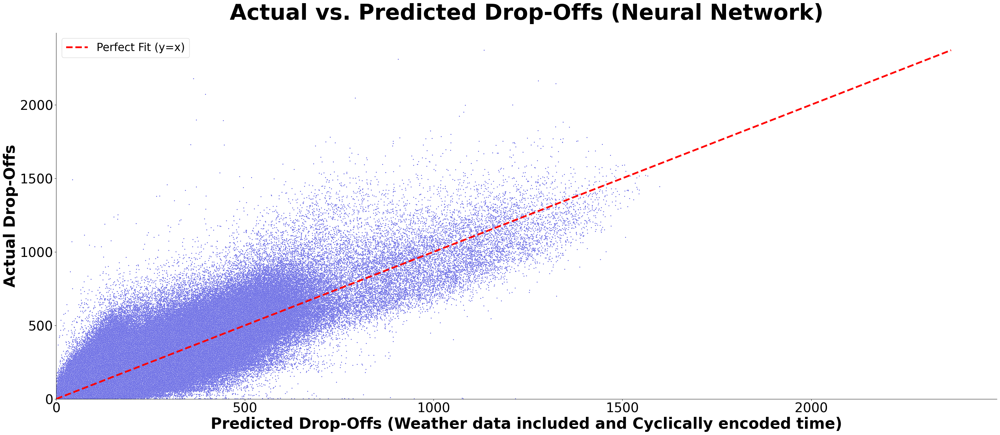

In [22]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER_CYCLt"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

# Add the perfect fit diagonal line
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Drop-Offs (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Drop-Offs (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNScatterDOsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

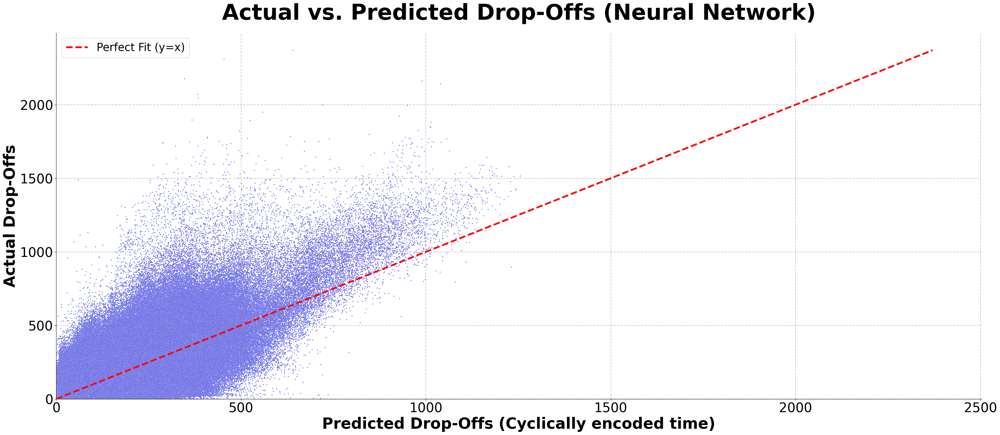

In [23]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsCYCLt"]


plt.figure(figsize=(32, 14))

sns.scatterplot(
    y=actuals,
    x=preds,
    color="#4C4EE0",
    s=5,
    rasterized=True
)

plt.grid(True, linestyle="--", alpha=0.4, linewidth=1.5, color="gray", zorder=0)

# Add the perfect fit diagonal line
# (AI generated)
max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Apply titles and labels (fonts scaled for the 32x14 figure)
plt.title("Actual vs. Predicted Drop-Offs (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Drop-Offs (Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()


plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNScatterDOsCYCLt.pdf", dpi=300)
plt.show()

Histograms

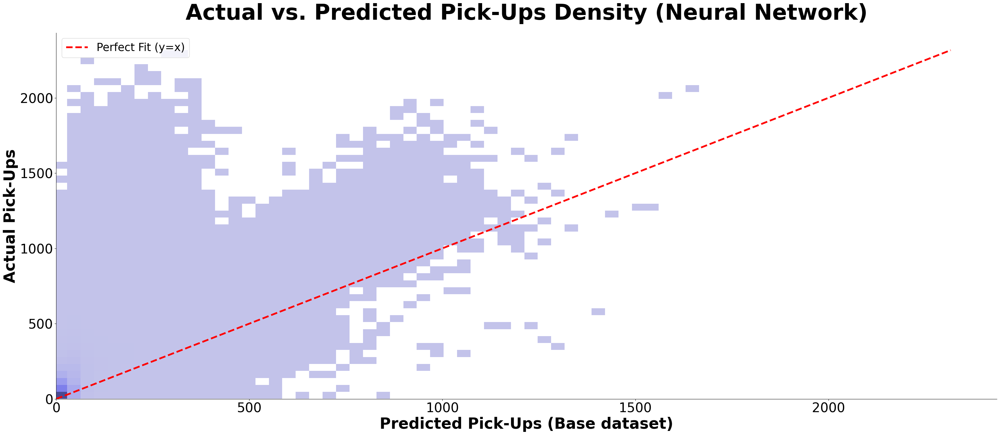

In [24]:
# Extract the actual values and the base Neural Network predictions from the filtered DataFrame
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUs"]

# Create a matplotlib figure with dimensions of 32 by 14 inches
plt.figure(figsize=(32, 14))

# Generate a 2D histogram to visualize the density of data points
sns.histplot(
    x=preds,
    y=actuals,
    bins=50,             # Divide the plotting area into a 50 by 50 grid
    color="#4C4EE0"      # Apply a hex color code for the histogram bins
)

# Identify the absolute maximum value present in either the actuals or predictions
max_val = max(actuals.max(), preds.max())

# Plot a dashed red reference line starting at (0,0) and ending at the maximum value (y=x)
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

# Set the title and axis labels, defining their specific font sizes, weights, and padding
plt.title("Actual vs. Predicted Pick-Ups Density (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Pick-Ups (Base dataset)", fontweight="bold", fontsize=35)

# Define the font size for the tick labels on both the x and y axes
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

# Lock the minimum values of both axes to 0
plt.xlim(left=0)
plt.ylim(bottom=0)

# Remove the top and right border lines of the plot framework
sns.despine()

# Position the plot legend in the upper left corner
plt.legend(fontsize=25, loc="upper left")

# Adjust the subplot layout to automatically fit the components into the figure boundaries
plt.tight_layout()

# Save the finalized plot as a 300 dpi PDF in the specified file path
#plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNHistPUs.pdf", dpi=300)

# Display the plot output
plt.show()

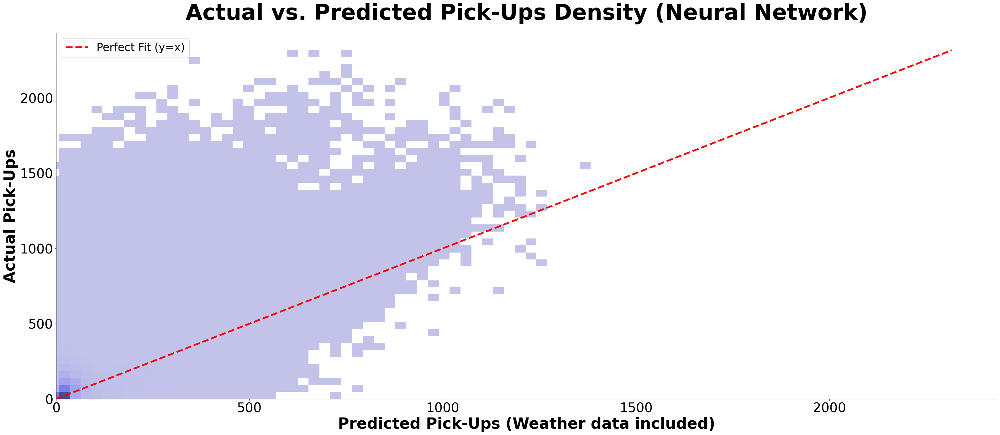

In [25]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Pick-Ups Density (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Pick-Ups (Weather data included)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNHistPUsWEATHER.pdf", dpi=300)
plt.show()

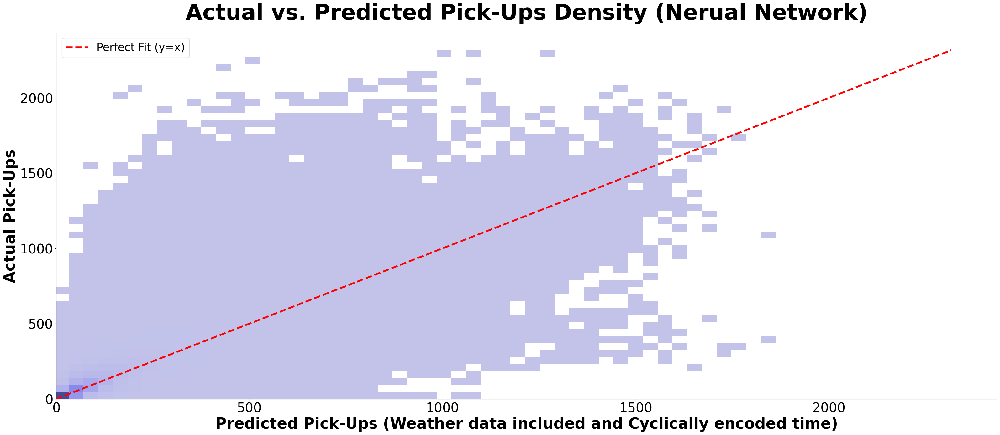

In [26]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsWEATHER_CYCLt"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Pick-Ups Density (Nerual Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Pick-Ups (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNHistPUsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

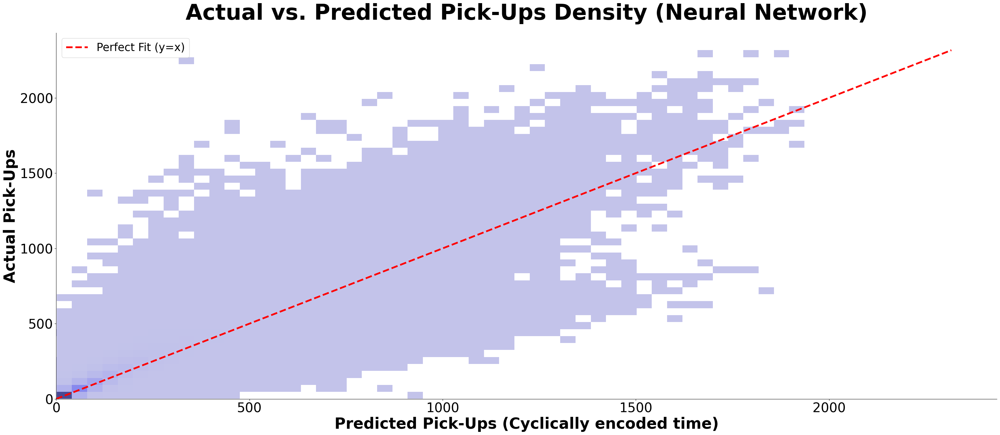

In [27]:
actuals = PU_filtered["Actual"]
preds = PU_filtered["PUsCYCLt"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Pick-Ups Density (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Pick-Ups", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Pick-Ups (Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNHistPUsCYCLt.pdf", dpi=300)
plt.show()

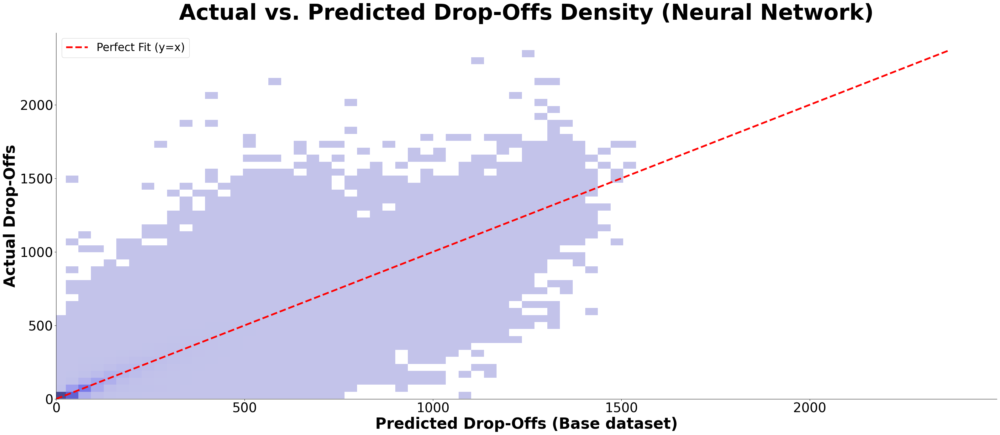

In [28]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOs"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Drop-Offs Density (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Drop-Offs (Base dataset)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNHistDOs.pdf", dpi=300)
plt.show()

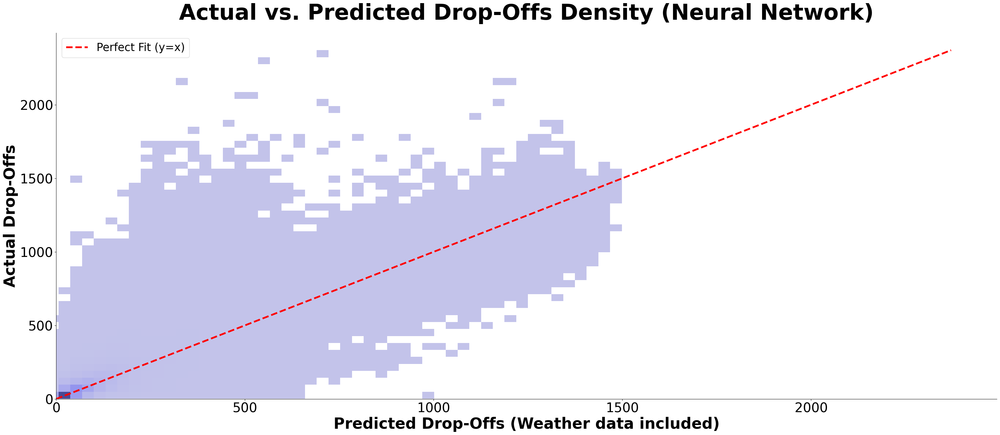

In [29]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Drop-Offs Density (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Drop-Offs (Weather data included)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNHistDOsWEATHER.pdf", dpi=300)
plt.show()

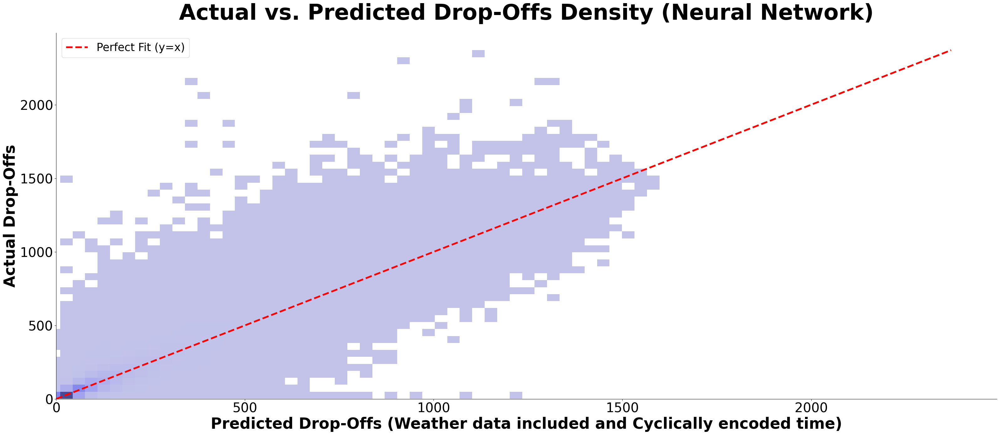

In [30]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsWEATHER_CYCLt"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Drop-Offs Density (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Drop-Offs (Weather data included and Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNHistDOsWEATHER_CYCLt.pdf", dpi=300)
plt.show()

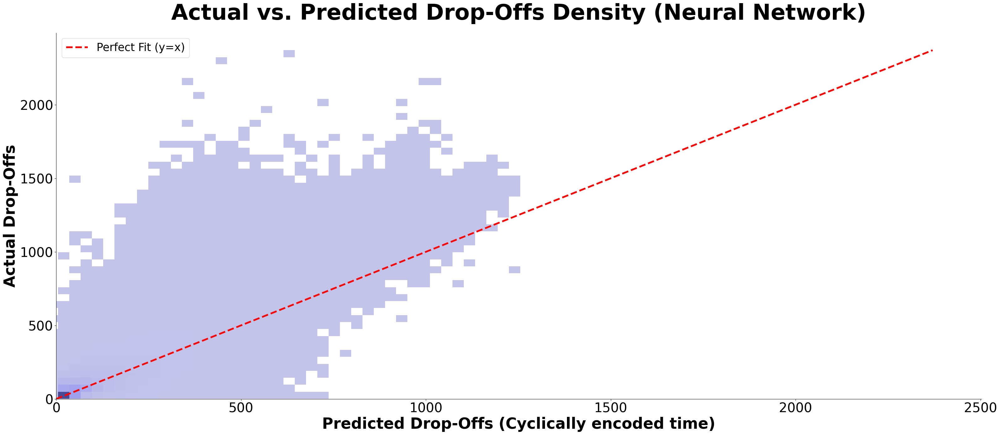

In [31]:
actuals = DO_filtered["Actual"]
preds = DO_filtered["DOsCYCLt"]

plt.figure(figsize=(32, 14))

sns.histplot(
    x=preds,
    y=actuals,
    bins=50,
    color="#4C4EE0"
)

max_val = max(actuals.max(), preds.max())
plt.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=4, label='Perfect Fit (y=x)')

plt.title("Actual vs. Predicted Drop-Offs Density (Neural Network)", fontsize=50, fontweight="bold", pad=30)
plt.ylabel("Actual Drop-Offs", fontweight="bold", fontsize=35)
plt.xlabel("Predicted Drop-Offs (Cyclically encoded time)", fontweight="bold", fontsize=35)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.xlim(left=0)
plt.ylim(bottom=0)
sns.despine()

plt.legend(fontsize=25, loc="upper left")

plt.tight_layout()
plt.savefig("drive/MyDrive/BT_Florian_2026/Evaluation Plots/NN/Scatter_Hist/NNHistDOsCYCLt.pdf", dpi=300)
plt.show()

Calulating Permutation Feature Importance

In [32]:
import os
import joblib
import pandas as pd
import tensorflow as tf
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error

def keras_scorer_DO(estimator, X, y):
    # Convert the feature array into a TensorFlow float32 tensor
    X_tensor = tf.constant(X, dtype=tf.float32)

    # Generate predictions silently (verbose=0) using a large batch size for inference speed,
    # then flatten the resulting 2D output array into a 1D format
    y_pred = estimator.predict(X, verbose=0, batch_size=10000).flatten()

    # Reverse the scaling transformation for the Drop-Off predictions (multiply by 125, add 68)
    y_pred_unscaled = (y_pred * 125) + 68

    # Reverse the scaling transformation for the Drop-Off actuals
    y_unscaled = (y * 125) + 68

    # Calculate and return the negative Mean Absolute Error using the unscaled values
    return -mean_absolute_error(y_unscaled, y_pred_unscaled)


feature_importances_dict = {}

for file in DO_datasets:
    # Read the parquet file into a DataFrame
    df = pd.read_parquet(file)

    # Rename the second column in the DataFrame to 'date'
    df = df.rename(columns={df.columns[1]:"date"})

    # Keep only the rows where the year is 2023 or 2024
    df = df[df["year"].isin([2023, 2024])]

    # Map the year values to binary integers (2023 to 0, 2024 to 1)
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop specific columns from the DataFrame, ignoring errors if they do not exist
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Remove any rows containing NaN values
    df = df.dropna()

    # Filter the DataFrame to create a test set containing data from January 1st, 2024 onwards
    df_test = df[df["date"]>=pd.to_datetime("2024-01-01")].copy()

    # Create the feature matrix by dropping 'trip_count' and 'date'
    X_test = df_test.drop(columns=["trip_count","date"])

    # Isolate the target variable 'trip_count'
    y_test = df_test["trip_count"]

    # Get the corresponding dataset string name
    dataset_name = DO_datasets[file]

    # Search through the list of Neural Network file paths to find the matching model
    right_model = None
    for model in nn_files:
        if f"{dataset_name}.keras" in model:
            right_model = model
            break

    print("1")

    # Clear the TensorFlow backend session to free memory before loading a new model
    tf.keras.backend.clear_session()

    # Load the matched Keras model from the file path without compiling it
    nn_model = tf.keras.models.load_model(right_model, compile=False)

    # Calculate the baseline score using the unshuffled test data
    baseline = keras_scorer_DO(nn_model, X_test, y_test)

    # Initialize a dictionary and list to track grouped feature columns
    groups = {}
    grouped_cols = []

    # Check for weather columns and group them together
    # (AI generated)
    if "WEATHER" in dataset_name:
        weather_keywords = ["snow_depth", "snowfall", "rain", "apparent_temperature"]
        weather_cols = [c for c in X_test.columns if any(w in c for w in weather_keywords)]
        if weather_cols:
            groups["Weather Features"] = weather_cols
            grouped_cols.extend(weather_cols)

    # Check for cyclical time columns and group sine/cosine pairs together
    # (AI generated)
    if "CYCLt" in dataset_name:
        for t in ["month", "day", "hour", "DoW"]:
            cols = [c for c in X_test.columns if t in c and any(s in c for s in ["sin", "cos"]) and c not in grouped_cols]
            if cols:
                groups[t] = cols
                grouped_cols.extend(cols)

    # Iterate through the remaining columns and add them as individual groups
    # (AI generated)
    for c in X_test.columns:
        if c not in grouped_cols:
            groups[c] = [c]

    # Calculate the permutation importance for each grouped feature set
    result = {}
    for name, cols in groups.items():
        drops = []
        # Execute 10 permutation iterations per group
        for i in range(10):
            X_shuff = X_test.copy()

            # Randomly shuffle the rows for the columns in the current group
            X_shuff[cols] = X_shuff[cols].sample(frac=1, random_state=100+i).values

            # Score the model using the shuffled data
            score = keras_scorer_DO(nn_model, X_shuff, y_test)

            # Calculate the difference between the baseline score and the shuffled score
            drops.append(baseline - score)

        # Average the score differences across the 10 iterations
        result[name] = sum(drops) / 10

    print("2")

    # Store the final importance values in a DataFrame
    importance_df = pd.DataFrame({
        "Model": dataset_name,
        "Feature": list(result.keys()),
        "Importance": list(result.values())
    })

    file_path = "drive/MyDrive/BT_Florian_2026/Trained Models/Neural Network_new/FeatureImportances_DOs.csv"

    # Check if the CSV file exists. If not, create it and write the headers.
    # If it exists, append the new DataFrame rows without writing the header again.
    if not os.path.isfile(file_path):
        importance_df.to_csv(file_path, index=False)
    else:
        importance_df.to_csv(file_path, mode="a", header=False, index=False)



1
2
1
2
1
2
1
2


In [33]:
import os
import joblib
import pandas as pd
import tensorflow as tf
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_absolute_error

def keras_scorer_PU(estimator, X, y):
    # Convert the feature array into a TensorFlow float32 tensor
    X_tensor = tf.constant(X, dtype=tf.float32)

    # Generate predictions silently (verbose=0) using a large batch size for inference speed,
    # then flatten the resulting 2D output array into a 1D format
    y_pred = estimator.predict(X, verbose=0, batch_size=10000).flatten()

    # Reverse the scaling transformation for the Pick-Up predictions (multiply by 126, add 71)
    y_pred_unscaled = (y_pred * 126) + 71

    # Reverse the scaling transformation for the Pick-Up actuals
    y_unscaled = (y * 126) + 71

    # Calculate and return the negative Mean Absolute Error using the unscaled values
    return -mean_absolute_error(y_unscaled, y_pred_unscaled)


feature_importances_dict = {}

for file in PU_datasets:
    # Read the parquet file into a DataFrame
    df = pd.read_parquet(file)

    # Rename the second column in the DataFrame to 'date'
    df = df.rename(columns={df.columns[1]:"date"})

    # Keep only the rows where the year is 2023 or 2024
    df = df[df["year"].isin([2023, 2024])]

    # Map the year values to binary integers (2023 to 0, 2024 to 1)
    df["year"] = df["year"].map({2023: 0, 2024: 1})

    # Drop specific columns from the DataFrame, ignoring errors if they do not exist
    df = df.drop(columns=["DOLocationID", "PULocationID"], errors="ignore")
    df = df.drop(columns=["precipitation"], errors='ignore')
    df = df.drop(columns=["total_amount"], errors="ignore")

    # Remove any rows containing NaN values
    df = df.dropna()

    # Filter the DataFrame to create a test set containing data from January 1st, 2024 onwards
    df_test = df[df["date"]>=pd.to_datetime("2024-01-01")].copy()

    # Create the feature matrix by dropping 'trip_count' and 'date'
    X_test = df_test.drop(columns=["trip_count","date"])

    # Isolate the target variable 'trip_count'
    y_test = df_test["trip_count"]

    # Get the corresponding dataset string name
    dataset_name = PU_datasets[file]

    # Search through the list of Neural Network file paths to find the matching model
    right_model = None
    for model in nn_files:
        if f"{dataset_name}.keras" in model:
            right_model = model
            break

    print("1")

    # Clear the TensorFlow backend session to free memory before loading a new model
    tf.keras.backend.clear_session()

    # Load the matched Keras model from the file path without compiling it
    nn_model = tf.keras.models.load_model(right_model, compile=False)

    # Calculate the baseline score using the unshuffled test data
    baseline = keras_scorer_PU(nn_model, X_test, y_test)

    # Initialize a dictionary and list to track grouped feature columns
    groups = {}
    grouped_cols = []

    # Check for weather columns and group them together
    # (AI generated)
    if "WEATHER" in dataset_name:
        weather_keywords = ["snow_depth", "snowfall", "rain", "apparent_temperature"]
        weather_cols = [c for c in X_test.columns if any(w in c for w in weather_keywords)]
        if weather_cols:
            groups["Weather Features"] = weather_cols
            grouped_cols.extend(weather_cols)

    # Check for cyclical time columns and group sine/cosine pairs together
    # (AI generated)
    if "CYCLt" in dataset_name:
        for t in ["month", "day", "hour", "DoW"]:
            cols = [c for c in X_test.columns if t in c and any(s in c for s in ["sin", "cos"]) and c not in grouped_cols]
            if cols:
                groups[t] = cols
                grouped_cols.extend(cols)

    # Iterate through the remaining columns and add them as individual groups
    # (AI generated)
    for c in X_test.columns:
        if c not in grouped_cols:
            groups[c] = [c]

    # Calculate the permutation importance for each grouped feature set
    result = {}
    for name, cols in groups.items():
        drops = []
        # Execute 10 permutation iterations per group
        for i in range(10):
            X_shuff = X_test.copy()

            # Randomly shuffle the rows for the columns in the current group
            X_shuff[cols] = X_shuff[cols].sample(frac=1, random_state=100+i).values

            # Score the model using the shuffled data
            score = keras_scorer_PU(nn_model, X_shuff, y_test)

            # Calculate the difference between the baseline score and the shuffled score
            drops.append(baseline - score)

        # Average the score differences across the 10 iterations
        result[name] = sum(drops) / 10

    print("2")

    # Store the final importance values in a DataFrame
    importance_df = pd.DataFrame({
        "Model": dataset_name,
        "Feature": list(result.keys()),
        "Importance": list(result.values())
    })

    file_path = "drive/MyDrive/BT_Florian_2026/Trained Models/Neural Network_new/FeatureImportances_PUs.csv"

    # Check if the CSV file exists. If not, create it and write the headers.
    # If it exists, append the new DataFrame rows without writing the header again.
    if not os.path.isfile(file_path):
        importance_df.to_csv(file_path, index=False)
    else:
        importance_df.to_csv(file_path, mode="a", header=False, index=False)

1
2
1
2
1
2
1
2
